http://docs.pytorch.org/audio/stable/tutorials/speech_recognition_pipeline_tutorial.html

In [15]:
import torch
import torchaudio

print(torch.__version__)
print(torchaudio.__version__)

torch.random.manual_seed(0)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

print(device)

2.8.0+cu126
2.8.0+cu126
cpu


In [16]:
import IPython
import matplotlib.pyplot as plt
from torchaudio.utils import download_asset

# SPEECH_FILE = download_asset("tutorial-assets/Lab41-SRI-VOiCES-src-sp0307-ch127535-sg0042.wav")

--- 추가 부분 ---

In [17]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [18]:
# 2. 파일 불러오기

import librosa, torch

#data collected from : https://www.kaggle.com/datasets/pavanelisetty/sample-audio-files-for-speech-recognition?resource=download
SPEECH_FILE = "/content/drive/MyDrive/Colab Notebooks/audio_dataset/harvard.wav"

--- 추가 부분 ---

In [19]:
bundle = torchaudio.pipelines.WAV2VEC2_ASR_BASE_960H

print("Sample Rate:", bundle.sample_rate)

print("Labels:", bundle.get_labels())

Sample Rate: 16000
Labels: ('-', '|', 'E', 'T', 'A', 'O', 'N', 'I', 'H', 'S', 'R', 'D', 'L', 'U', 'M', 'W', 'C', 'F', 'G', 'Y', 'P', 'B', 'V', 'K', "'", 'X', 'J', 'Q', 'Z')


In [20]:
model = bundle.get_model().to(device)

print(model.__class__)

<class 'torchaudio.models.wav2vec2.model.Wav2Vec2Model'>


In [21]:
IPython.display.Audio(SPEECH_FILE)

In [22]:
waveform, sample_rate = torchaudio.load(SPEECH_FILE)
waveform = waveform.to(device)

if sample_rate != bundle.sample_rate:
    waveform = torchaudio.functional.resample(waveform, sample_rate, bundle.sample_rate)

In [23]:
with torch.inference_mode():
    features, _ = model.extract_features(waveform)

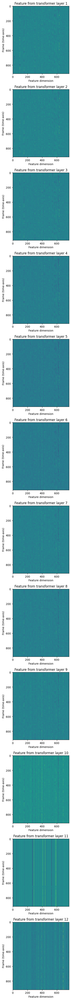

In [24]:
fig, ax = plt.subplots(len(features), 1, figsize=(16, 4.3 * len(features)))
for i, feats in enumerate(features):
    ax[i].imshow(feats[0].cpu(), interpolation="nearest")
    ax[i].set_title(f"Feature from transformer layer {i+1}")
    ax[i].set_xlabel("Feature dimension")
    ax[i].set_ylabel("Frame (time-axis)")
fig.tight_layout()

In [25]:
with torch.inference_mode():
    emission, _ = model(waveform)

Class labels: ('-', '|', 'E', 'T', 'A', 'O', 'N', 'I', 'H', 'S', 'R', 'D', 'L', 'U', 'M', 'W', 'C', 'F', 'G', 'Y', 'P', 'B', 'V', 'K', "'", 'X', 'J', 'Q', 'Z')


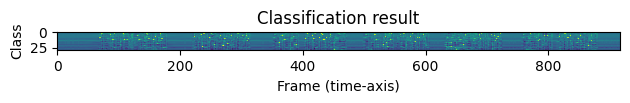

In [26]:
plt.imshow(emission[0].cpu().T, interpolation="nearest")
plt.title("Classification result")
plt.xlabel("Frame (time-axis)")
plt.ylabel("Class")
plt.tight_layout()
print("Class labels:", bundle.get_labels())

In [27]:
class GreedyCTCDecoder(torch.nn.Module):
    def __init__(self, labels, blank=0):
        super().__init__()
        self.labels = labels
        self.blank = blank

    def forward(self, emission: torch.Tensor) -> str:
        """Given a sequence emission over labels, get the best path string
        Args:
          emission (Tensor): Logit tensors. Shape `[num_seq, num_label]`.

        Returns:
          str: The resulting transcript
        """
        indices = torch.argmax(emission, dim=-1)  # [num_seq,]
        indices = torch.unique_consecutive(indices, dim=-1)
        indices = [i for i in indices if i != self.blank]
        return "".join([self.labels[i] for i in indices])

In [28]:
decoder = GreedyCTCDecoder(labels=bundle.get_labels())
transcript = decoder(emission[0])

In [29]:
print(transcript)
IPython.display.Audio(SPEECH_FILE)

THE|STALE|SMELL|OF|OLD|BEER|LINGERS|IT|TAKES|HEAT|TO|BRING|OUT|THE|ODOUR|A|COLD|DIP|RESTORES|HEALTH|AND|ZEST|A|SALT|PICKLE|TASTES|FINE|WITH|HAM|TAKOZAL|PASTOR|ARE|MY|FAVORITE|A|ZESTFUL|FOOD|IS|THE|HOT|CROSS|BUN|


In [30]:
# model = torchaudio.pipelines.WAV2VEC2_ASR_BASE_960H.get_model()
# emission = model(waveforms, ...)

NameError: name 'waveforms' is not defined